In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import glob
import io
import rpcm
import json
import glob

from bundle_adjust import ba_asp as utils
from bundle_adjust import ba_utils
from PIL import Image
import pickle

# Display and interface settings (just for the notebook interface)
%load_ext autoreload
%autoreload 2
np.set_printoptions(linewidth=150)

# One pair

In [32]:
ASP_output_dir = '../ames_test3/ba_rpc'
ASP_input_dir = '../ames_test3'

adjust_fnames = sorted(glob.glob(os.path.join(ASP_output_dir, '*.adjust')))
geotif_fnames = [ASP_input_dir+'/{}.tif'.format(utils.get_id(fn).replace('run-', '')) for fn in adjust_fnames]

### Sanity check 1: Plot 2D matches

581 2d matches found in ../ames_test3/ba_rpc/run-20190617_075138_ssc2d2_0006_basic_panchr__20190617_075212_ssc2d2_0009_basic_panchr-clean.match



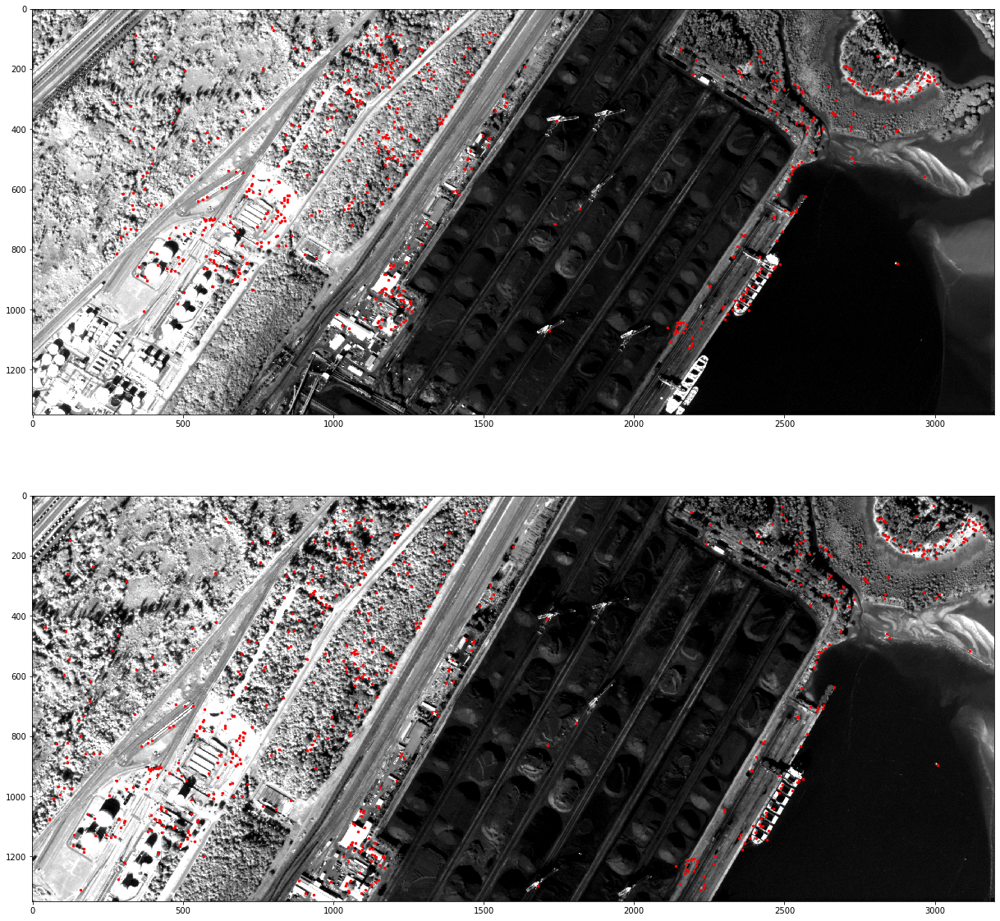

In [33]:
matches_fname = glob.glob(os.path.join(ASP_output_dir, '*.match'))[0]
matched_pts_raw = utils.read_AMES_match_binary_file(matches_fname, verbose=False)

matches_fname = glob.glob(os.path.join(ASP_output_dir, '*clean.match'))[0]
matched_pts = utils.read_AMES_match_binary_file(matches_fname, verbose=False)
print('{} 2d matches found in {}\n'.format(matched_pts[0].shape[0], matches_fname))

# collect descriptors of clean matches (for some reason they are not saved in *clean.match)
pts_1_list = matched_pts_raw[0].tolist()
pts_2_list = matched_pts_raw[1].tolist()
matched_pts[2] = np.array([matched_pts_raw[2][pts_1_list.index(x)] for x in matched_pts[0].tolist()])
matched_pts[3] = np.array([matched_pts_raw[3][pts_2_list.index(x)] for x in matched_pts[1].tolist()])

utils.plot_matches(geotif_fnames[0], geotif_fnames[1], matched_pts[0], matched_pts[1], scale=6)

### Sanity check 2: Reproject 3D points using inital RPCs + correcting ingredients (R + T + rotation center)

581 3d points found


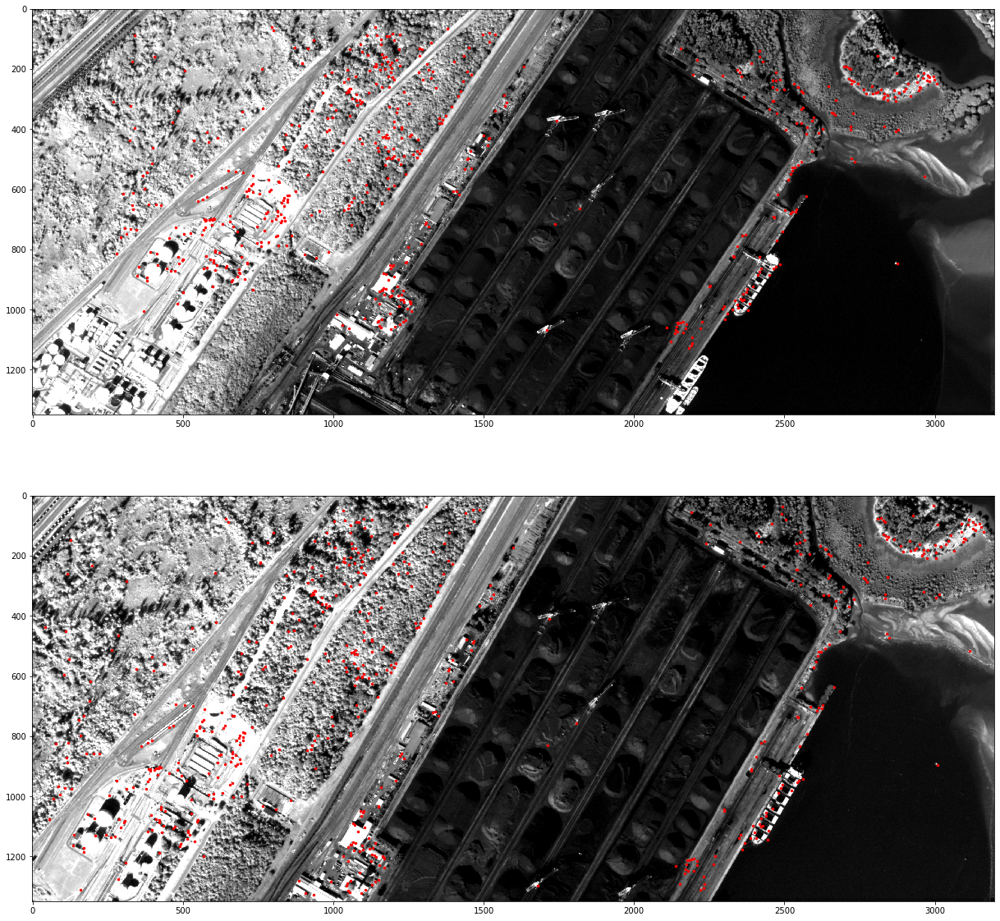

In [35]:
#points_fname = '{}/run-final_points.kml'.format(ASP_output_dir)
#pts_3d_asp_ecef = utils.read_ASP_points_file(points_fname)

point_log_fname = os.path.join(ASP_output_dir, 'run-final_residuals_no_loss_function_pointmap_point_log.csv')
pts_3d_asp_ecef, residual, obs = utils.read_point_log_csv(point_log_fname)

'''
pts_3d_asp_ecef, obs_2d = utils.read_cnet_csv(os.path.join(ASP_output_dir, 'run-cnet.csv'))
clean_pts = [matched_pts[0], matched_pts[1]]
geotif_ids = [utils.get_id(fn) for fn in geotif_fnames]
outlier_indices = []
for pt_idx in range(pts_3d_asp_ecef.shape[0]):
    for cam_fname, pt_2d in zip(obs_2d[pt_idx]['fnames'], obs_2d[pt_idx]['proj'].tolist()):
        cam_idx = geotif_ids.index(utils.get_id(cam_fname))
        if not pt_2d in clean_pts[cam_idx].tolist():
            outlier_indices.append(pt_idx)
outlier_indices = np.unique(outlier_indices)
pts_3d_asp_ecef = np.delete(pts_3d_asp_ecef, outlier_indices, axis=0)
'''

print('{} 3d points found'.format(pts_3d_asp_ecef.shape[0]))
reproj_pts = []
for adjust_fname, tif_fname in zip(adjust_fnames, geotif_fnames):
    
    # project the bundle adjusted points with the bundle adjusted cameras
    rpc_init = rpcm.rpc_from_geotiff(tif_fname)
    m_translation, m_rotation, m_center = utils.read_ASP_adjust_file(adjust_fname)
    
    pts_reproj_rpc_asp = utils.ames_project_adjusted_points(rpc_init, m_rotation, m_translation, pts_3d_asp_ecef,
                                                            m_rotation_center=np.array(m_center))
    
    # project the bundle adjusted points with the original cameras
    #pts_reproj_rpc_asp = ba_utils.apply_rpc_projection(rpc_init, pts_3d_asp_ecef)
    
    reproj_pts.append(pts_reproj_rpc_asp)
    
utils.plot_matches(geotif_fnames[0], geotif_fnames[1], reproj_pts[0], reproj_pts[1], scale=6)

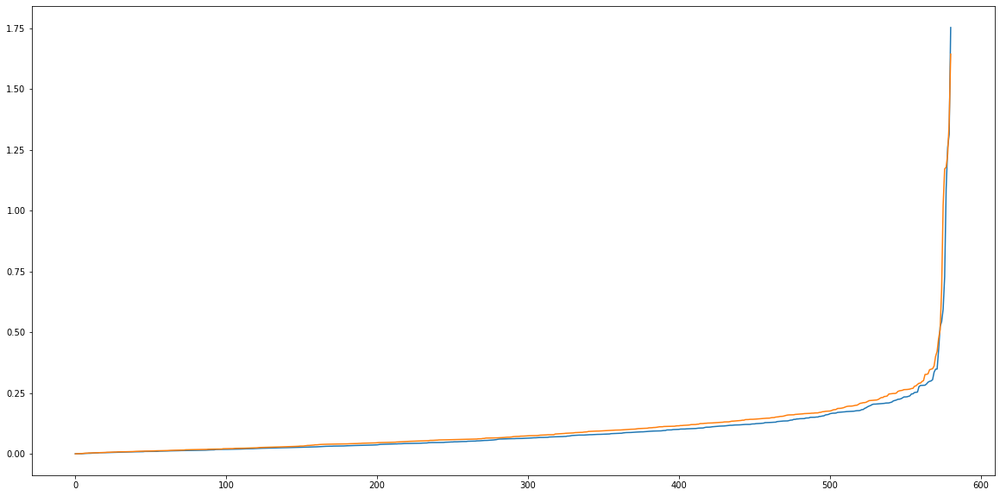

In [99]:
fig = plt.figure(figsize=(20,10))
plt.plot(np.sort(residual))
plt.plot(np.sort(residual_reproj))
plt.show()

average reprojection error: 0.344 / 0.358
19 matches with reprojection error above 1


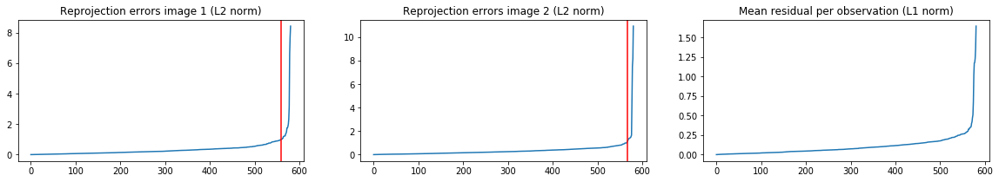

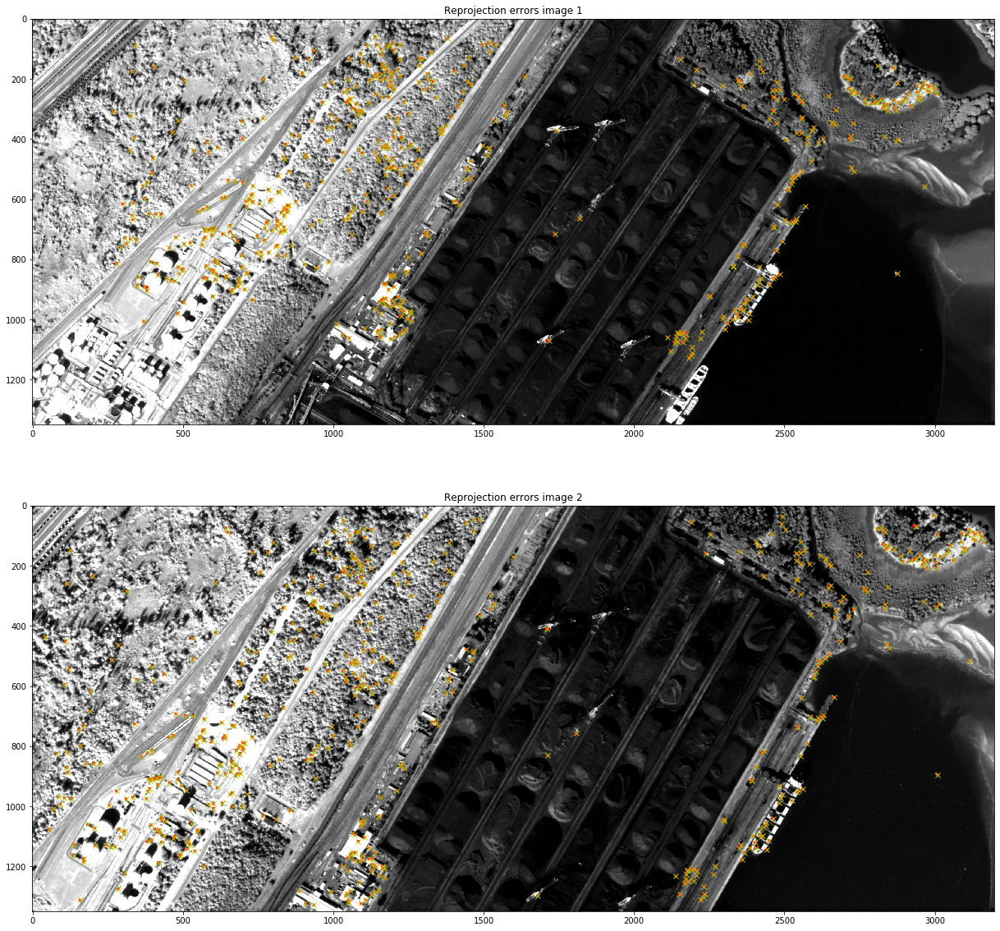

In [36]:
avg_residual_reproj = utils.plot_reproj_pair_detail(geotif_fnames[0], geotif_fnames[1], 
                                    matched_pts[0], matched_pts[1], reproj_pts[0], reproj_pts[1])


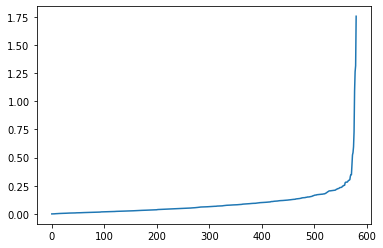

In [79]:
residuals_fname = os.path.join(ASP_output_dir, 'run-final_residuals_no_loss_function_raw_pixels.txt')
residuals = utils.read_residuals_raw_pixels(residuals_fname)

tmp = np.mean(np.hstack([abs(residuals[0]['residuals']), abs(residuals[1]['residuals'])]), axis=1)
plt.plot(np.sort(tmp));

### Sanity check 3: Triangulate the 2D matches and reproject them

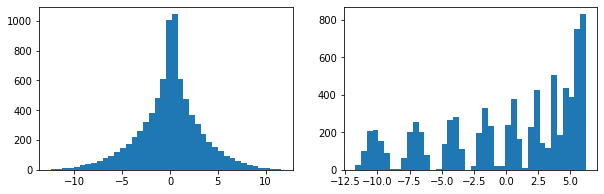

approximate_rpc_as_projective: (min, max, mean)
distance on cols: -12.474179553806152 11.660619007349851 -2.8625732909883793e-06
distance on rows: -11.72631450510471 6.205880745650802 -3.688207839247104e-05


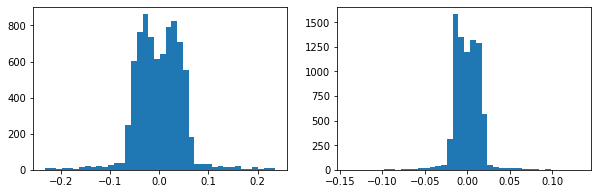

approximate_rpc_as_projective: (min, max, mean)
distance on cols: -0.23360697944553976 0.23597560982216237 -7.243723665339985e-10
distance on rows: -0.13914005723472656 0.13232792956523554 1.806735151599348e-09


In [37]:
# fit bundle adjusted projection matrices
P_tmp, reproj_pts_tmp = [], []
for adjust_fname, tif_fname in zip(adjust_fnames, geotif_fnames):
    _, _, P = utils.ames_fit_corrected_rpc(tif_fname, adjust_fname, pts_3d_asp_ecef)
    P_tmp.append(P)
    reproj_pts_tmp.append(ba_utils.apply_projection_matrix(P, pts_3d_asp_ecef))

baseline: 250728.878 GOOD
average reprojection error: 0.898 / 0.759
187 matches with reprojection error above 1


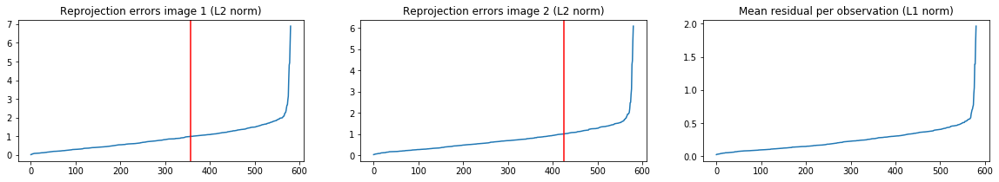

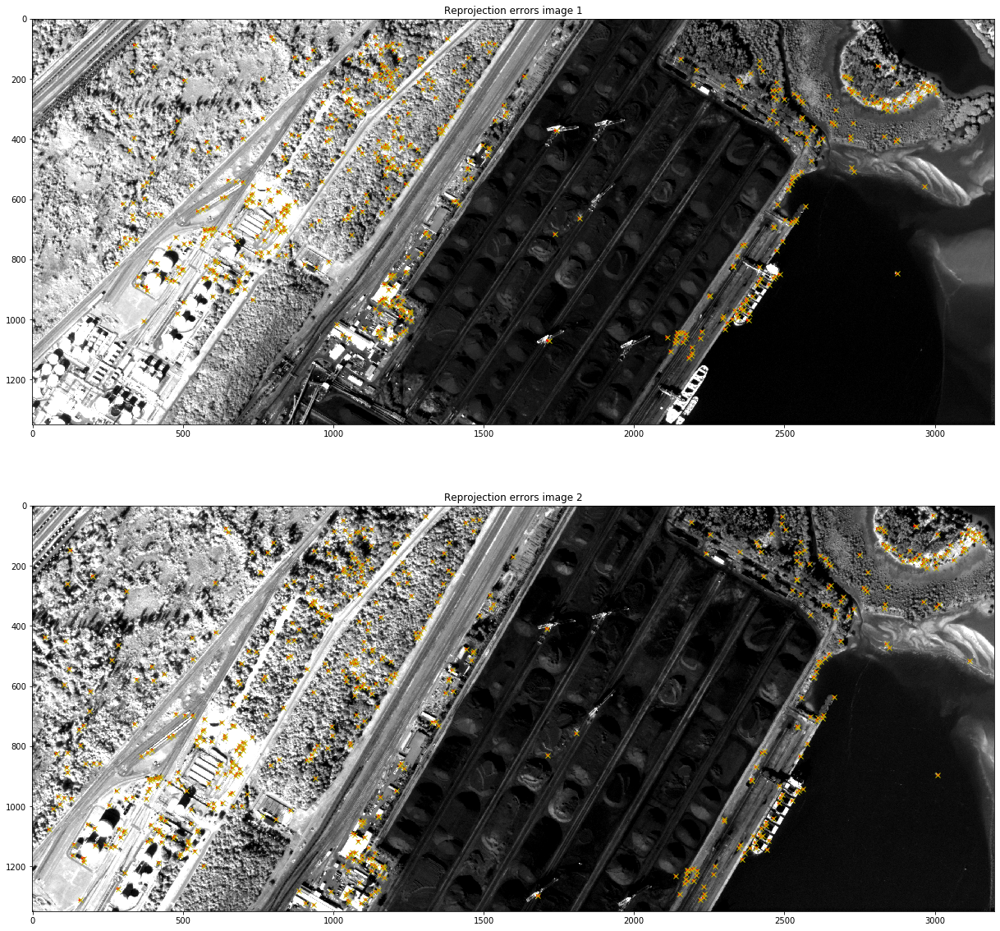

baseline: 250728.878 GOOD
average reprojection error: 0.000 / 0.000
0 matches with reprojection error above 1


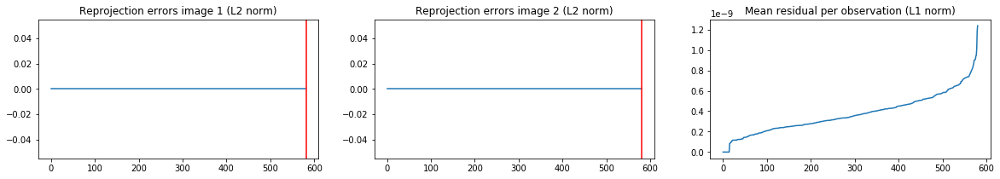

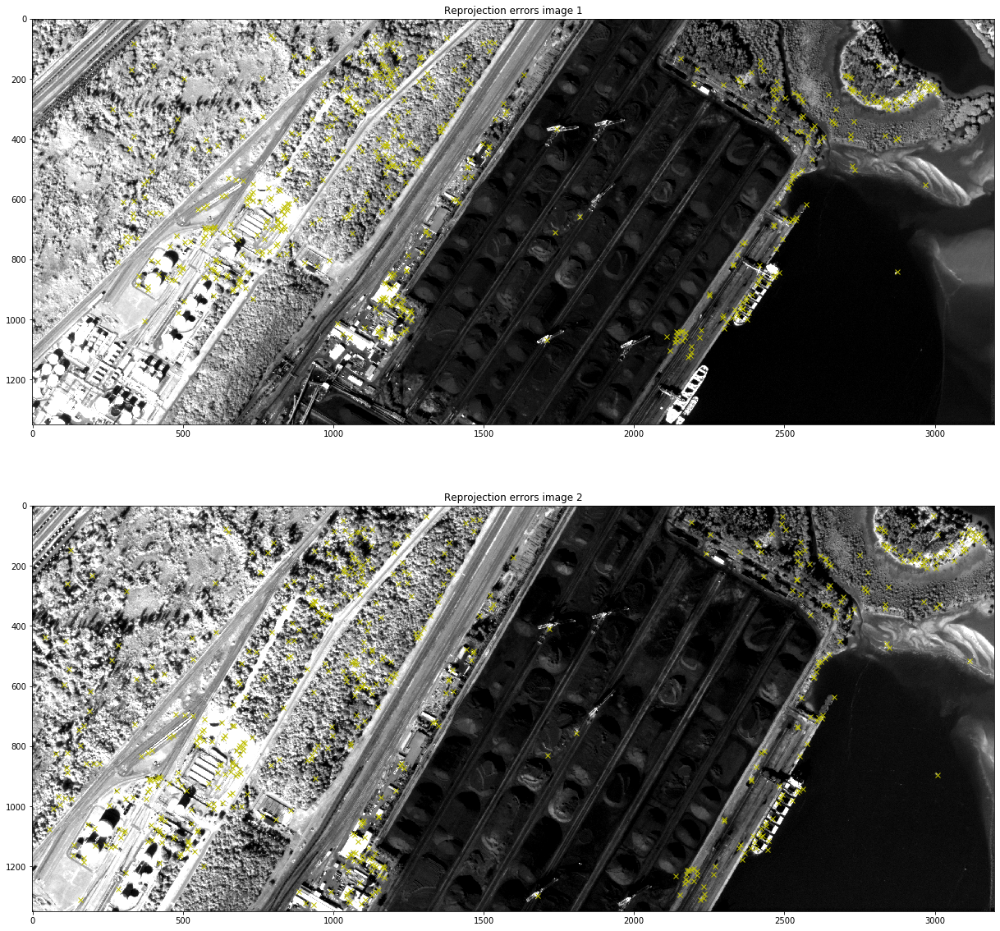

In [39]:
utils.check_pair(geotif_fnames[0], geotif_fnames[1], P_tmp[0], P_tmp[1], matched_pts[0], matched_pts[1])

utils.check_pair(geotif_fnames[0], geotif_fnames[1], P_tmp[0], P_tmp[1], reproj_pts_tmp[0], reproj_pts_tmp[1])

# Multiple views

In [2]:
ASP_output_dir = '../ames_test3/ba_rpc_all'
ASP_input_dir = '../ames_test3'

adjust_fnames = sorted(glob.glob(os.path.join(ASP_output_dir, '*.adjust')))
geotif_fnames = [ASP_input_dir+'/{}.tif'.format(utils.get_id(fn).replace('run-', '')) for fn in adjust_fnames]

output_dir = 'exp/RB_ZAF_0001/ba_ASP_singledate'
os.makedirs(output_dir, exist_ok=True)

os.makedirs(os.path.join(output_dir, 'RPC_adj'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'P_adj'), exist_ok=True)

# read 3d points and observations
point_log_fname = os.path.join(ASP_output_dir, 'run-final_residuals_no_loss_function_pointmap_point_log.csv')
pts_3d_ba_all, residual, obs, outlier_flag = utils.read_point_log_csv(point_log_fname)
pts_3d_cnet, obs_2d = utils.read_cnet_csv(os.path.join(ASP_output_dir, 'run-cnet.csv'))
point_log_fname = os.path.join(ASP_output_dir, 'run-initial_residuals_no_loss_function_pointmap_point_log.csv')
pts_3d_init_all, residual, obs, _ = utils.read_point_log_csv(point_log_fname)

pts_3d_init = pts_3d_init_all[~np.array(outlier_flag)]
pts_3d_ba = pts_3d_ba_all[~np.array(outlier_flag)]
obs_2d = (np.array(obs_2d)[~np.array(outlier_flag)]).tolist()

print('input data loaded')

input data loaded


lat max-min: -28.812418936188912 -28.83263051585859
lon max-min: 32.06535781960519 32.04300893610072
alt max-min: 253.49019392915068 -306.57656738334333


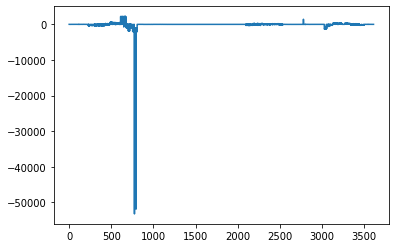

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

In [3]:
# print limits of bbox containing the bundle adjusted points
lat, lon, alt = ba_utils.ecef_to_latlon_custom(pts_3d_ba[:,0], pts_3d_ba[:,1], pts_3d_ba[:,2])
lat_max, lat_min = np.percentile(lat, 95), np.percentile(lat, 5)
lon_max, lon_min = np.percentile(lon, 95), np.percentile(lon, 5)
alt_max, alt_min = np.percentile(alt, 95), np.percentile(alt, 5)

print('lat max-min:', lat_max, lat_min)
print('lon max-min:', lon_max, lon_min)
print('alt max-min:', alt_max, alt_min)

plt.plot(alt)
plt.show()

from bundle_adjust.ba_triangulation import project_xyz_bbx_on_map

project_xyz_bbx_on_map(pts_3d_ba, map_zoom=14)

### 1. Build feature tracks and get pairs

9 cameras and 594 feature tracks
23 pairs to triangulate: [(3, 8), (3, 4), (1, 3), (2, 6), (4, 8), (7, 8), (6, 7), (4, 5), (2, 5), (5, 6), (0, 8), (1, 4), (0, 1), (1, 7), (2, 4), (4, 7), (1, 8), (1, 2), (1, 5), (0, 3), (2, 7), (3, 7), (5, 7)]


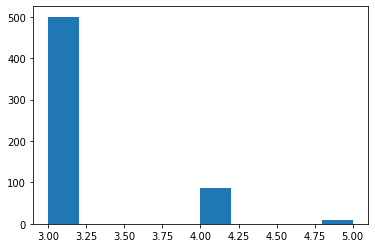

----- CONNECTIVITY GRAPH: 25 edges


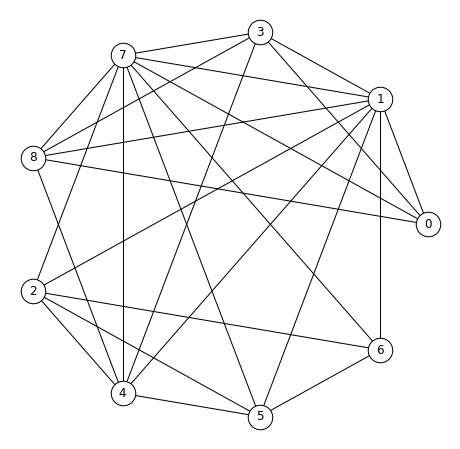

In [4]:
geotif_ids = [utils.get_id(fn) for fn in geotif_fnames]
n_tracks = pts_3d_init.shape[0]
n_cams = len(geotif_fnames)

min_track_length = 3

# build C
C = np.zeros((n_cams*2, n_tracks))
C[:] = np.nan
for t_idx in range(n_tracks):
    if len(obs_2d[t_idx]['fnames']) >= min_track_length:
        for im_fname, im_coords in zip(obs_2d[t_idx]['fnames'], obs_2d[t_idx]['proj']):
            cam_idx = geotif_ids.index(utils.get_id(im_fname))
            C[2*cam_idx,t_idx] = im_coords[0]
            C[2*cam_idx+1,t_idx] = im_coords[1]

cols_to_keep = np.arange(n_tracks)[np.sum(~np.isnan(C), axis=0)/2 > 0]
C = C[:, cols_to_keep]

pts_3d_init = pts_3d_init[cols_to_keep, :]
pts_3d_ba = pts_3d_ba[cols_to_keep, :]
obs_2d = (np.array(obs_2d)[cols_to_keep]).tolist()

# get pairs to triangulate
pairs_to_match = []
ids_40char = [utils.get_id(fn)[:40] for fn in geotif_fnames]
match_fnames = glob.glob('{}/*-clean.match'.format(ASP_output_dir))
min_matches = 0
total_matches_count = 0 

for fn in match_fnames:
    i = ids_40char.index(utils.get_id(fn).replace('run-', '')[:40])
    j = ids_40char.index(utils.get_id(fn).replace('run-', '')[42:42+40])

    m = utils.read_AMES_match_binary_file(fn, verbose=False)
    pts_i, pts_j = m[0], m[1]
    n_pts = pts_i.shape[0]
    if n_pts > min_matches:
        pair = (min(i,j), max(i,j))
        pairs_to_match.append(pair)
        #print('pair {}: {} matches'.format(pair, n_pts))
        total_matches_count += n_pts
pairs_to_triangulate = pairs_to_match.copy()

print('{} cameras and {} feature tracks'.format(int(C.shape[0]/2), C.shape[1]))
print('{} pairs to triangulate: {}'.format(len(pairs_to_triangulate), pairs_to_triangulate))


plt.hist(np.sum(~np.isnan(C), axis=0)/2);
plt.show()

ba_utils.plot_connectivity_graph(C, 0, save_pgf=False);

lat max-min: -28.813914577730657 -28.83225725666199
lon max-min: 32.06451954491155 32.04307124796776
alt max-min: 15.493374426243836 -5.006491839885712


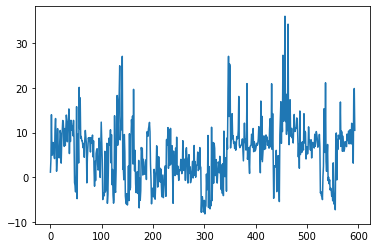

In [5]:
# print limits of bbox containing the bundle adjusted points
lat, lon, alt = ba_utils.ecef_to_latlon_custom(pts_3d_ba[:,0], pts_3d_ba[:,1], pts_3d_ba[:,2])
lat_max, lat_min = np.percentile(lat, 95), np.percentile(lat, 5)
lon_max, lon_min = np.percentile(lon, 95), np.percentile(lon, 5)
alt_max, alt_min = np.percentile(alt, 95), np.percentile(alt, 5)

print('lat max-min:', lat_max, lat_min)
print('lon max-min:', lon_max, lon_min)
print('alt max-min:', alt_max, alt_min)

plt.plot(alt)
plt.show()

### 2. Check reprojection error

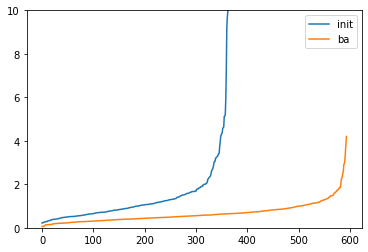

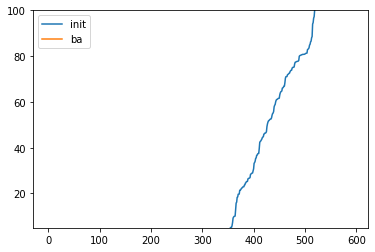

In [6]:
input_seq = [np.array(Image.open(fn)) for fn in geotif_fnames]
init_rpcs = [rpcm.rpc_from_geotiff(fn) for fn in geotif_fnames]

pts_3d_ba_available = True

hC, wC = C.shape
feature_track_index = np.random.choice(np.arange(0, wC))
p_ind = feature_track_index

reprojection_error_all, reprojection_error_all_ba  = [], []


verbose= True
verbose= False

points_to_study = [p_ind]
points_to_study = np.arange(pts_3d_ba.shape[0]).tolist()

already_one_figure = False
pt_count = 0
for p_ind in points_to_study:
    
    im_ind = [k for k, j in enumerate(range(n_cams)) if not np.isnan(C[j*2,p_ind])]
    
    if verbose:
        print('Displaying feature track with index {}, length {}\n'.format(p_ind, len(im_ind)))
    
    p_2d_gt, p_2d_proj, p_2d_proj_ba = [], [], []
    for i in im_ind:   

        p_2d_gt.append(C[(i*2):(i*2+2),p_ind])

        p_2d_proj.append(ba_utils.apply_rpc_projection(init_rpcs[i], np.array([pts_3d_init[p_ind,:]]))[0])

        if pts_3d_ba_available:
            
            # project the bundle adjusted points with the bundle adjusted cameras
            adjust_fname = os.path.join(ASP_output_dir, 'run-' + utils.get_id(geotif_fnames[i]) + '.adjust')
            m_translation, m_rotation, m_center = utils.read_ASP_adjust_file(adjust_fname)

            p_2d_proj_ba.append(utils.ames_project_adjusted_points(init_rpcs[i], m_rotation, 
                                                                m_translation, np.array([pts_3d_ba[p_ind,:]]),
                                                                m_rotation_center=np.array(m_center))[0])
            
    p_2d_gt = np.array(p_2d_gt)
    p_2d_proj = np.array(p_2d_proj)
    p_2d_proj_ba = np.array(p_2d_proj_ba)
    
    reproj_err = np.linalg.norm(p_2d_proj - p_2d_gt, axis=1)
    if pts_3d_ba_available:
        reproj_err_ba = np.linalg.norm(p_2d_proj_ba - p_2d_gt, axis=1)
    
    #if np.mean(reproj_err_ba) > 1000 and not already_one_figure:
    #    verbose = True
            
    if verbose:
        print('3D location (initial)  :', pts_3d_init[p_ind,:].ravel())
        if pts_3d_ba_available:
            print('3D location (after BA) :', pts_3d_ba[p_ind,:].ravel(), '\n')

        print(' ----> Real 2D loc in im', im_ind, ' (yellow) \n', p_2d_gt)
        print(' ----> Proj 2D loc in im', im_ind, ' before BA (red) \n', p_2d_proj)
        if pts_3d_ba_available:
            print(' ----> Proj 2D loc in im', im_ind, ' after  BA (green) \n', p_2d_proj_ba)
        
        print('\n****** Reprojection error beofre BA:', np.round(reproj_err, 3))
        if pts_3d_ba_available:
            print('****** Reprojection error after  BA:', np.round(reproj_err_ba, 3))
            
        for i, im_idx in enumerate(im_ind):   
            fig = plt.figure(figsize=(10,20))
            plt.imshow(input_seq[im_idx], cmap="gray")
            plt.plot(*p_2d_gt[i,:], "yo")
            plt.plot(*p_2d_proj[i,:], "ro")
            if pts_3d_ba_available:
                plt.plot(*p_2d_proj_ba[i,:], "go")
            plt.show()
            
        verbose = False
        already_one_figure = True
        

    
    reprojection_error_all.append(np.mean(reproj_err))
    reprojection_error_all_ba.append(np.mean(reproj_err_ba))
    pt_count +=1
    if not verbose:
        print('\r{} points of {}'.format(pt_count, len(points_to_study)), end='\r')
        
reprojection_error_all_ba = np.array(reprojection_error_all_ba)
reprojection_error_all = np.array(reprojection_error_all)

plt.plot(np.sort(reprojection_error_all), label='init')
plt.plot(np.sort(reprojection_error_all_ba), label='ba')
axes = plt.gca()
axes.set_ylim([0,10])
plt.legend()
plt.show();

plt.plot(np.sort(reprojection_error_all), label='init')
plt.plot(np.sort(reprojection_error_all_ba), label='ba')
axes = plt.gca()
axes.set_ylim([5, 100])
plt.legend()
plt.show();

lat max-min: -28.813905925335728 -28.832284943860905
lon max-min: 32.06454106918203 32.04304634437904
alt max-min: 15.27429485102181 -5.03586158156395


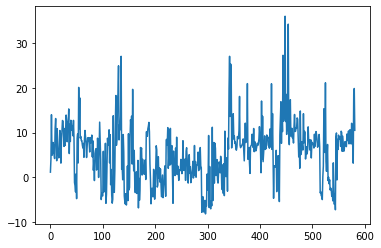

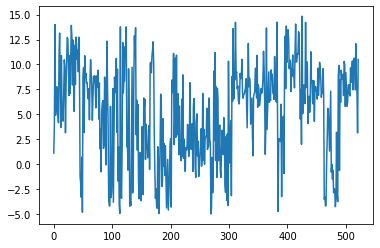

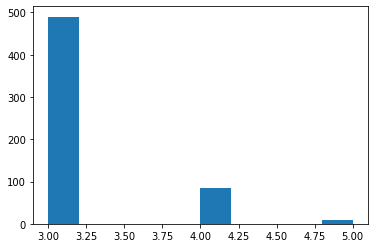

----- CONNECTIVITY GRAPH: 25 edges


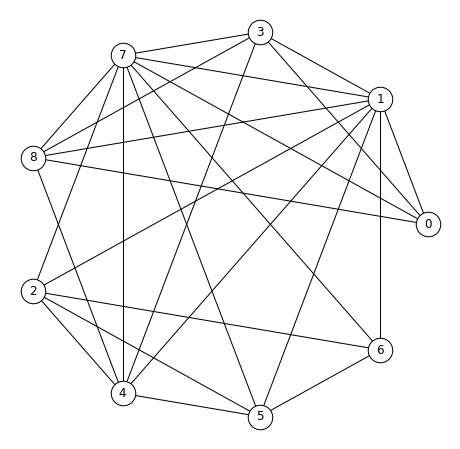

In [7]:
# print limits of bbox containing the bundle adjusted points

cols_to_keep = reprojection_error_all_ba < 2.
C = C[:, cols_to_keep]
pts_3d_init = pts_3d_init[cols_to_keep, :]
pts_3d_ba = pts_3d_ba[cols_to_keep, :]
obs_2d = (np.array(obs_2d)[cols_to_keep]).tolist()

lat, lon, alt = ba_utils.ecef_to_latlon_custom(pts_3d_ba[:,0], pts_3d_ba[:,1], pts_3d_ba[:,2])
lat_max, lat_min = np.percentile(lat, 95), np.percentile(lat, 5)
lon_max, lon_min = np.percentile(lon, 95), np.percentile(lon, 5)
alt_max, alt_min = np.percentile(alt, 95), np.percentile(alt, 5)

print('lat max-min:', lat_max, lat_min)
print('lon max-min:', lon_max, lon_min)
print('alt max-min:', alt_max, alt_min)

plt.plot(alt)
plt.show()
plt.plot(alt[np.logical_and(alt <= alt_max, alt >= alt_min)])
plt.show()

plt.hist(np.sum(~np.isnan(C), axis=0)/2);
plt.show()

ba_utils.plot_connectivity_graph(C, 0, save_pgf=False);

### 1. Fit bundle adjusted RPCs using inital RPCs + correcting ingredients

In [24]:
for i, (adjust_fname, tif_fname) in enumerate(zip(adjust_fnames, geotif_fnames)):

    f_id = utils.get_id(tif_fname)
    
    # fit rpc and projection matrix
    rpc_calib, rmse_err, P = utils.ames_fit_corrected_rpc(tif_fname, adjust_fname, pts_3d_ba, verbose=False)
    
    # save rpc
    rpc_fname = os.path.join(output_dir, 'RPC_adj/{}_RPC_adj.txt'.format(f_id))
    rpc_calib.write_to_file(rpc_fname)
    
    # save projection matrix
    h, w = np.array(Image.open(tif_fname)).shape
    bbox = {'col0': 0.0, 'row0': 0.0, 'height': h, 'width': w}
    P_fname = os.path.join(output_dir, 'P_adj/{}_pinhole_adj.json'.format(f_id))
    ba_utils.write_proj_matrix_to_file(P_fname, P, bbox)
    
    print('({}) {}: reprojection error = {:.6f}'.format(i, f_id, rmse_err))
    
print('done')

(0) 20190617_075138_ssc2d2_0005_basic_panchromatic_dn: reprojection error = 0.002699
(1) 20190617_075138_ssc2d2_0006_basic_panchromatic_dn: reprojection error = 0.000362
(2) 20190617_075138_ssc2d2_0007_basic_panchromatic_dn: reprojection error = 0.000738
(3) 20190617_075212_ssc2d2_0008_basic_panchromatic_dn: reprojection error = 0.001280
(4) 20190617_075212_ssc2d2_0009_basic_panchromatic_dn: reprojection error = 0.000113
(5) 20190617_075212_ssc2d2_0010_basic_panchromatic_dn: reprojection error = 0.000520
(6) 20190617_075248_ssc2d2_0011_basic_panchromatic_dn: reprojection error = 0.000710
(7) 20190617_075248_ssc2d2_0012_basic_panchromatic_dn: reprojection error = 0.000093
(8) 20190617_075248_ssc2d2_0013_basic_panchromatic_dn: reprojection error = 0.001185
done


FILE:   ../ames_test3/20190617_075138_ssc2d2_0005_basic_panchromatic_dn.tif
../ames_test3/20190617_075138_ssc2d2_0005_basic_panchromatic_dn.tif, mean abs reproj error before BA: 19.0619
../ames_test3/20190617_075138_ssc2d2_0005_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 6.4918


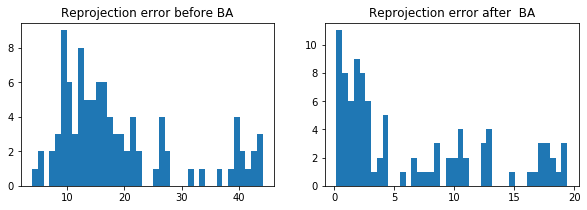

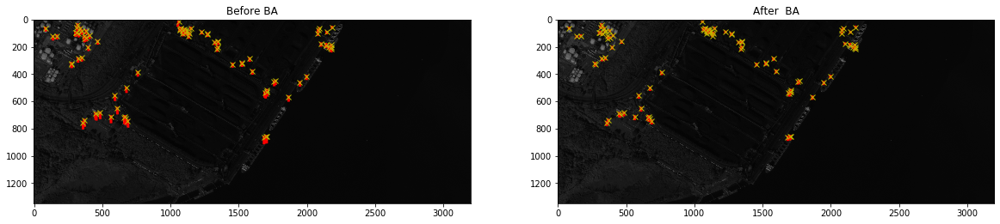

avg_residuals: 1.6808468938112673
00: avg init err 19.06, avg ba err 6.49

#########################################################################################

FILE:   ../ames_test3/20190617_075138_ssc2d2_0006_basic_panchromatic_dn.tif
../ames_test3/20190617_075138_ssc2d2_0006_basic_panchromatic_dn.tif, mean abs reproj error before BA: 31.4333
../ames_test3/20190617_075138_ssc2d2_0006_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 25.6044


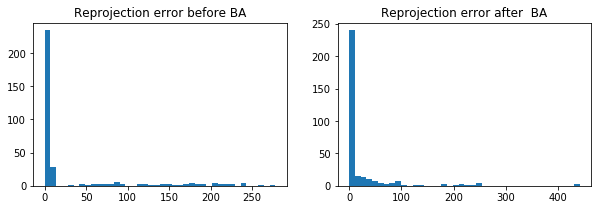

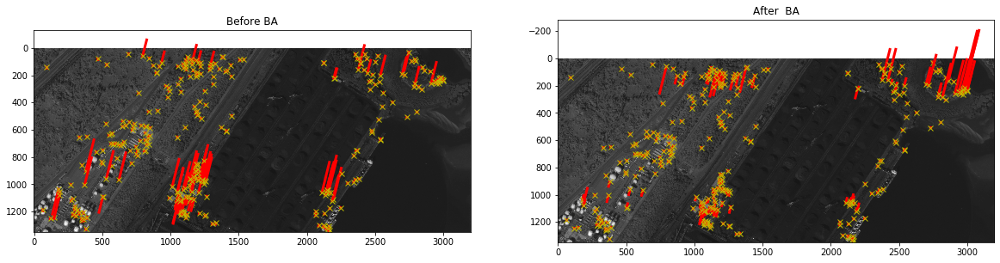

avg_residuals: 7.752595286394263
01: avg init err 31.43, avg ba err 25.60

#########################################################################################

FILE:   ../ames_test3/20190617_075138_ssc2d2_0007_basic_panchromatic_dn.tif
../ames_test3/20190617_075138_ssc2d2_0007_basic_panchromatic_dn.tif, mean abs reproj error before BA: 24.1145
../ames_test3/20190617_075138_ssc2d2_0007_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 16.0817


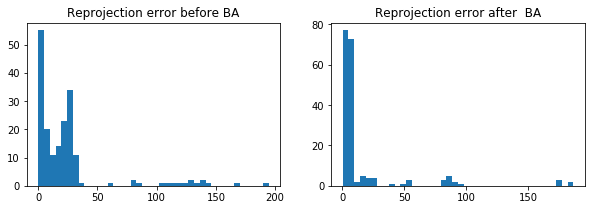

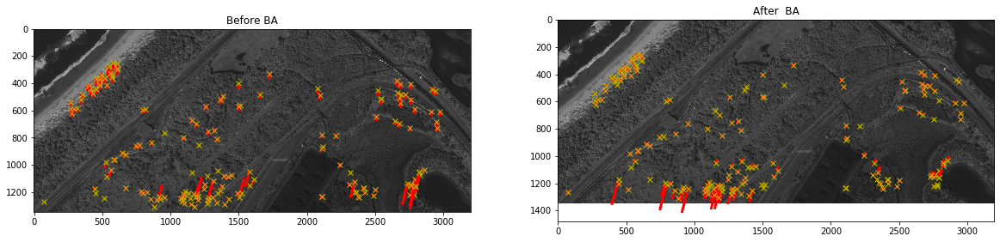

avg_residuals: 4.812195846232928
02: avg init err 24.11, avg ba err 16.08

#########################################################################################

FILE:   ../ames_test3/20190617_075212_ssc2d2_0008_basic_panchromatic_dn.tif
../ames_test3/20190617_075212_ssc2d2_0008_basic_panchromatic_dn.tif, mean abs reproj error before BA: 97.1054
../ames_test3/20190617_075212_ssc2d2_0008_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 14.3408


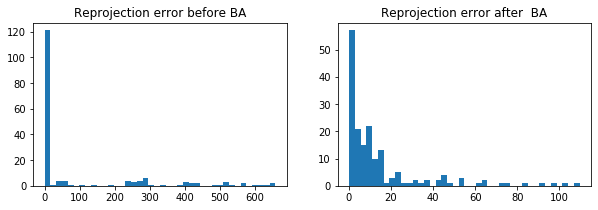

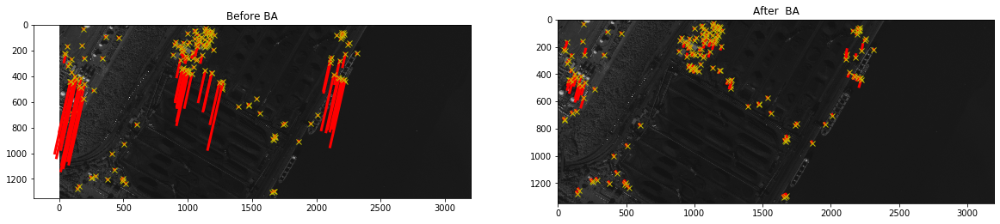

avg_residuals: 4.499894056421867
03: avg init err 97.11, avg ba err 14.34

#########################################################################################

FILE:   ../ames_test3/20190617_075212_ssc2d2_0009_basic_panchromatic_dn.tif
../ames_test3/20190617_075212_ssc2d2_0009_basic_panchromatic_dn.tif, mean abs reproj error before BA: 25.0296
../ames_test3/20190617_075212_ssc2d2_0009_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 3.4175


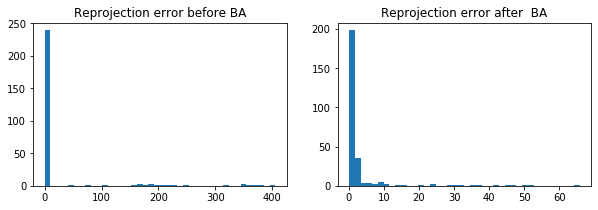

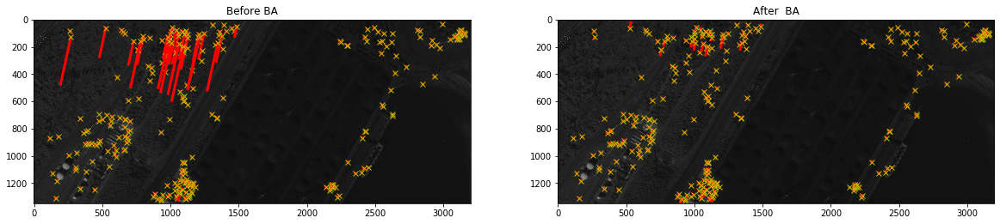

avg_residuals: 1.0387927107607662
04: avg init err 25.03, avg ba err 3.42

#########################################################################################

FILE:   ../ames_test3/20190617_075212_ssc2d2_0010_basic_panchromatic_dn.tif
../ames_test3/20190617_075212_ssc2d2_0010_basic_panchromatic_dn.tif, mean abs reproj error before BA: 32.6793
../ames_test3/20190617_075212_ssc2d2_0010_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 6.5415


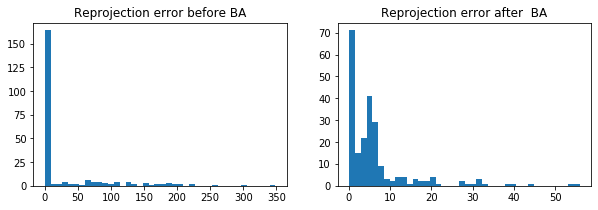

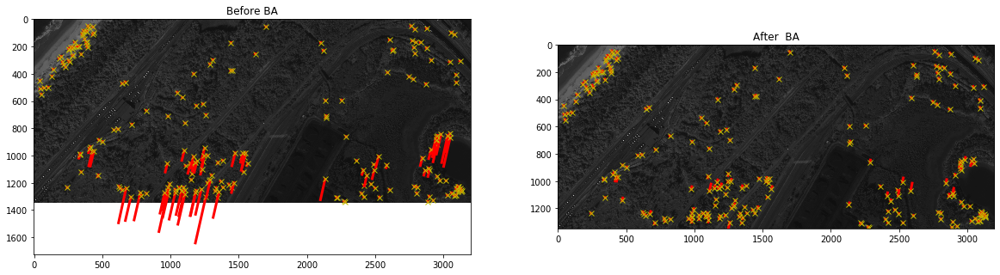

avg_residuals: 2.0244141951945003
05: avg init err 32.68, avg ba err 6.54

#########################################################################################

FILE:   ../ames_test3/20190617_075248_ssc2d2_0011_basic_panchromatic_dn.tif
../ames_test3/20190617_075248_ssc2d2_0011_basic_panchromatic_dn.tif, mean abs reproj error before BA: 1.6663
../ames_test3/20190617_075248_ssc2d2_0011_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 5.0007


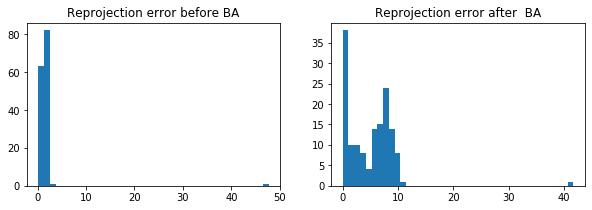

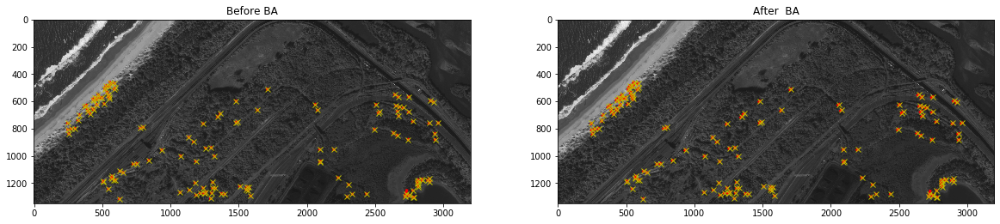

avg_residuals: 1.7118023456694784
06: avg init err 1.67, avg ba err 5.00

#########################################################################################

FILE:   ../ames_test3/20190617_075248_ssc2d2_0012_basic_panchromatic_dn.tif
../ames_test3/20190617_075248_ssc2d2_0012_basic_panchromatic_dn.tif, mean abs reproj error before BA: 38.3579
../ames_test3/20190617_075248_ssc2d2_0012_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 20.4725


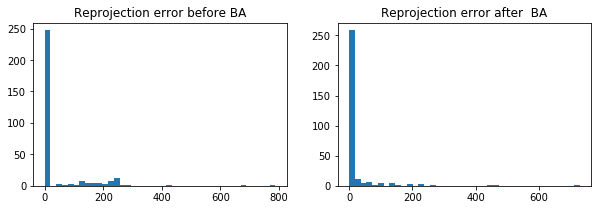

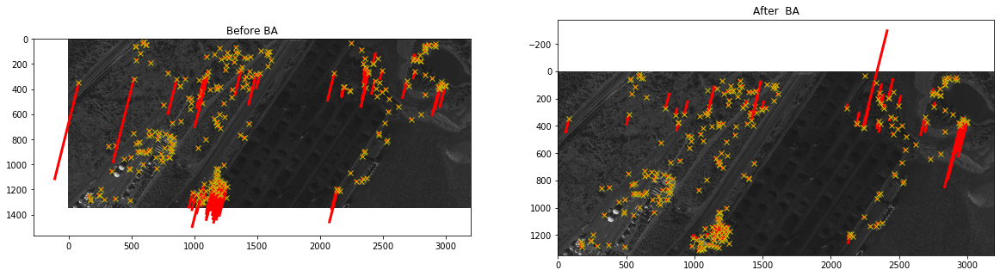

avg_residuals: 6.230047080533232
07: avg init err 38.36, avg ba err 20.47

#########################################################################################

FILE:   ../ames_test3/20190617_075248_ssc2d2_0013_basic_panchromatic_dn.tif
../ames_test3/20190617_075248_ssc2d2_0013_basic_panchromatic_dn.tif, mean abs reproj error before BA: 135.7084
../ames_test3/20190617_075248_ssc2d2_0013_basic_panchromatic_dn.tif, mean abs reproj error after  BA: 17.5805


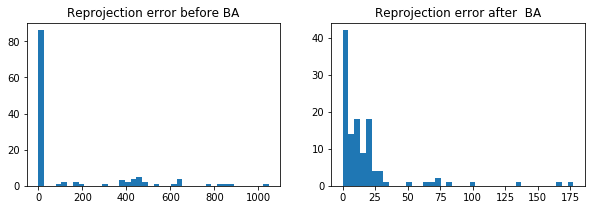

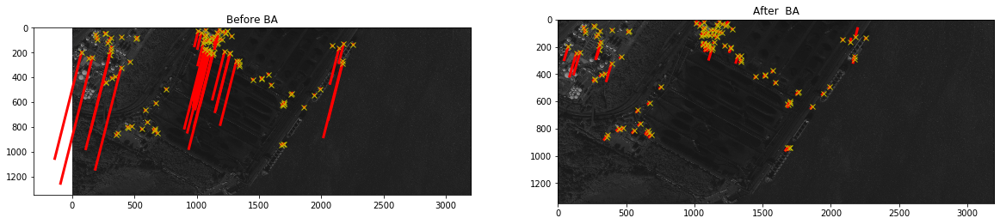

avg_residuals: 5.7020859077543715
08: avg init err 135.71, avg ba err 17.58

#########################################################################################



In [15]:
from bundle_adjust import ba_core
from bundle_adjust import ba_metrics

myimages = geotif_fnames

# estimate rpcs as affine projection matrices
lats, lons, alts = ba_utils.ecef_to_latlon_custom(pts_3d_ba[:,0], 
                                                  pts_3d_ba[:,1], 
                                                  pts_3d_ba[:,2])
lon, lat, alt = np.median(lons), np.median(lats), np.median(alts)

rpcs_adj = [rpcm.rpc_from_rpc_file(output_dir+'/RPC_adj/{}_RPC_adj.txt'.format(utils.get_id(fn))) for fn in geotif_fnames]
rpcs_init = [rpcm.rpc_from_geotiff(fn) for fn in geotif_fnames]
P_init = [ba_core.get_affine_cam_from_rpc(rpc, {'col0': 0, 'row0':0}, lon, lat, alt) for rpc in rpcs_init]
P_adj = [ba_core.get_affine_cam_from_rpc(rpc, {'col0': 0, 'row0':0}, lon, lat, alt) for rpc in rpcs_adj]
cam_model = 'Affine'

#pairs_to_triangulate.remove((0,1))
#pairs_to_triangulate.remove((1,2))

from bundle_adjust.ba_triangulation import initialize_3d_points
pts_3d = initialize_3d_points(P_init, C, pairs_to_triangulate, cam_model)
pts_3d_ba = initialize_3d_points(P_adj, C, pairs_to_triangulate, cam_model)

# compute reprojection error
avg_init, avg_ba = [], []
for im_idx in range(len(myimages)):
    
    print('FILE:  ', geotif_fnames[im_idx])
    # pick all points visible in the selected image
    pts_gt = C[(im_idx*2):(im_idx*2+2),~np.isnan(C[im_idx*2,:])].T
    
    pts_3d_before = pts_3d_init[~np.isnan(C[im_idx*2,:]),:]
    pts_3d_after = pts_3d_ba[~np.isnan(C[im_idx*2,:]),:]
    
    
    avg_residuals, e_init, e_ba, _, _, _ = ba_metrics.reprojection_error_from_C(P_init[im_idx], P_adj[im_idx],
                                                                                pts_gt, pts_3d_before, pts_3d_after, 
                                                                                C, image_fname=myimages[im_idx], 
                                                                                verbose=True)
    print('avg_residuals:', np.mean(avg_residuals))
    
    avg_init.append(np.mean(e_init))
    avg_ba.append(np.mean(e_ba))

    #ba_pipeline.analyse_reproj_err_particular_image(im_idx, plot=True)

    print('{:02}: avg init err {:.2f}, avg ba err {:.2f}'.format(im_idx, avg_init[-1], avg_ba[-1]))
    print('\n#########################################################################################\n')
    

### Check performance of our bundle adjustment

In [21]:
pts_3d = np.loadtxt('../ames_test3/20190617_075138_ssc2d2_0006_basic_panchromatic_dn.points')


for fname in image_fnames:
    
    print('########################################################')
    
    f_id = get_id(fname)
    
    rpc_init = rpcm.rpc_from_geotiff(fname)
    
    with open('exp/skysat_coal_singledate/P_init/{}_pinhole.json'.format(f_id), 'r') as f:
        P_init = np.array(json.load(f)['P'])
        
    with open('exp/skysat_coal_singledate/P_adj/{}_pinhole_adj.json'.format(f_id), 'r') as f:   
        P_adj = np.array(json.load(f)['P'])
    
    rpc_adj = rpcm.rpc_from_rpc_file('exp/skysat_coal_singledate/RPC_adj/{}_RPC_adj.txt'.format(f_id))
    
    with open('exp/skysat_coal_singledate/P_init/{}_pinhole.json'.format(f_id), 'r') as f:
        P_init = np.array(json.load(f)['P'])
        
    proj = P_init @ np.hstack((pts_3d, np.ones((pts_3d.shape[0],1)))).T
    pts_reproj_P_init = (proj[:2,:]/proj[-1,:]).T
    print('reproj P init:', pts_reproj_P_init[0,:])
    
    proj = P_adj @ np.hstack((pts_3d, np.ones((pts_3d.shape[0],1)))).T
    pts_reproj_P_ba = (proj[:2,:]/proj[-1,:]).T
    #print(pts_reproj_P_ba[0,:])
    
    apply_rpc_projection(rpc, pts_3d)
    print('reproj RPC init', pts_reproj_rpc_init[0,:])
    
    lat, lon, alt = ba_utils.ecef_to_latlon_custom(pts_3d[:,0], pts_3d[:,1], pts_3d[:,2])
    col, row = rpc_adj.projection(lon, lat, alt)
    pts_reproj_rpc_ba = np.vstack((col, row)).T
    #print(pts_reproj_rpc_ba[0,:])
    
    pts_gt = np.loadtxt('../ames_test3/{}.matches'.format(f_id))
    
    print('\nFile', f_id)
    print('--------------------------------------------------------')
    print('mean rpc-to-P fit error:', mean_error_lists_of_points(pts_reproj_P_init, pts_reproj_rpc_init))
    print('mean reprojection error P_init:', mean_error_lists_of_points(pts_reproj_P_init, pts_gt))
    print('mean reprojection error RPC_init:', mean_error_lists_of_points(pts_reproj_rpc_init, pts_gt))
    print('\n')
    print('mean P-to-rpc fit error:', mean_error_lists_of_points(pts_reproj_P_ba, pts_reproj_rpc_ba))
    print('mean reprojection error P_ba - ROGER:', mean_error_lists_of_points(pts_reproj_P_ba, pts_gt))
    print('mean reprojection error RPC_ba - ROGER:', mean_error_lists_of_points(pts_reproj_rpc_ba, pts_gt))
    print('########################################################')
    
    print('\n\n\n\n')

########################################################
reproj P init: [1148.39790763  196.86428631]
reproj RPC init [1149.61546333  196.66516313]

File 20190617_075138_ssc2d2_0006_basic_panchromatic_dn
--------------------------------------------------------
mean rpc-to-P fit error: 1.709
mean reprojection error P_init: 76.594
mean reprojection error RPC_init: 76.358


mean P-to-rpc fit error: 0.0
mean reprojection error P_ba - ROGER: 0.496
mean reprojection error RPC_ba - ROGER: 0.496
########################################################





########################################################
reproj P init: [1048.74076817  212.06144748]
reproj RPC init [1048.77053238  212.06429733]

File 20190617_075212_ssc2d2_0009_basic_panchromatic_dn
--------------------------------------------------------
mean rpc-to-P fit error: 0.025
mean reprojection error P_init: 85.269
mean reprojection error RPC_init: 85.262


mean P-to-rpc fit error: 0.0
mean reprojection error P_ba - ROGER: 0.40

### Compare ASP to our bundle adjustment

In [ ]:
pickle_in = open('{}/{}/matches.pickle'.format(scene.dst_dir, ba_method),'rb')
pairwise_matches = pickle.load(pickle_in)
pickle_in = open('{}/{}/pairs_triangulation.pickle'.format(scene.dst_dir, ba_method),'rb')
pairs_to_triangulate = pickle.load(pickle_in)
pickle_in = open('{}/{}/filenames.pickle'.format(scene.dst_dir, ba_method),'rb')
myimages = pickle.load(pickle_in)


#forbbiden_pairs = [(1,12), (12,16)]
#if len(forbbiden_pairs) >0:
#    pairs_to_triangulate = list(set(pairs_to_triangulate) - set(forbbiden_pairs))

#allowed_im_indices = [14, 15, 16, 17, 18, 19, 20]
#allowed_pairs = [(im_i, im_j) for im_i in allowed_im_indices for im_j in allowed_im_indices if im_i != im_j and im_i<im_j]

#allowed_pairs = [(1,12), (12,16)]
#pairs_to_triangulate = list(set(pairs_to_triangulate).intersection(set(allowed_pairs)))


features = []
for fn in myimages:
    f_id = os.path.splitext(os.path.basename(fn))[0]
    features.append(pickle.load(open('{}/{}/features/{}.pickle'.format(scene.dst_dir, ba_method, f_id),'rb')))
    
from feature_tracks.ft_utils import feature_tracks_from_pairwise_matches
C, _ = feature_tracks_from_pairwise_matches(features, pairwise_matches, pairs_to_triangulate)

print('Using {} feature tracks\n'.format(C.shape))

print('pairs to triangulate:', pairs_to_triangulate)

### Reconstruct scene

#############################################################
Loading scene RB_ZAF_0001...

Found 85 different dates in the scene timeline

Total images in timeline: 560
Successfully loaded scene RB_ZAF_0001
#############################################################




Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

Scene RB_ZAF_0001 characterized using the following example dsm:
/home/carlo/dsms-timeseries-for-roger/RB_ZAF_0001/RB_ZAF_0001_dsms/s103_20190627T074821Z__s103_20190627T074854Z__s103_20190627T074931Z.tiff



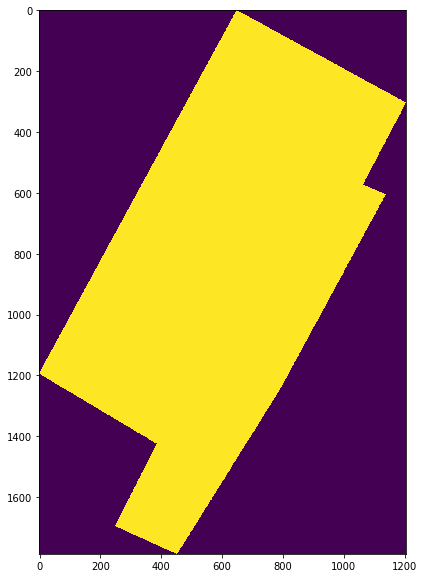

In [3]:
from bundle_adjust import ba_timeseries

scene_name = 'RB_ZAF_0001'

input_dir = '/home/carlo/dsms-timeseries-for-roger'
output_dir = 'exp'

scene = ba_timeseries.Scene(input_dir, output_dir, scene_name, 'v1', \
                            compute_aoi_masks=True, use_aoi_masks_to_equalize_crops=False)
scene.display_aoi()

source_dsms_dir = '{}/{}_dsms'.format(scene.src_dir, scene_name)
example_dsm_fname = os.path.join(source_dsms_dir, \
                                 's103_20190627T074821Z__s103_20190627T074854Z__s103_20190627T074931Z.tiff')
scene.characterize_from_example_dsm(example_dsm_fname)
scene.display_dsm_mask()

In [4]:
timeline_indices = [3]
scene.get_timeline_attributes(timeline_indices, ['datetime', 'n_images', 'id'])

index  |  datetime             |  n_images  |  id                                                           
____________________________________________________________________________________________________________

3      |  2019-06-17 07:51:38  |  9         |  s4_20190617T075138Z__s4_20190617T075212Z__s4_20190617T075248Z
____________________________________________________________________________________________________________

                                  9 total                                                                   




In [17]:
os.system('rm -r {}'.format(os.path.join(scene.dst_dir, 'ba_ASP_singledate/4D')))

scene.reconstruct_date(timeline_indices[0], ba_method='ba_ASP_singledate')


###################################################################################
Reconstructing scene RB_ZAF_0001 at time 2019-06-17 07:51:38
Timeline id: s4_20190617T075138Z__s4_20190617T075212Z__s4_20190617T075248Z
###################################################################################

Running s2p...

Computed 10 dsms / 10 (0 err)

Merging dsms...

Done!




In [47]:
scene.compute_3D_statistics_over_time([timeline_indices[0]], ba_method='ba_ASP_singledate')


Computing 4D statistics of the timeseries! Chosen dates:
2019-06-17 07:51:38

Done! Results were saved at exp/RB_ZAF_0001/ba_ASP_singledate/4D/4Dstats


### straight forward reconstruction

In [7]:
import rpcm

output_rpc_dir = os.path.join(scene.dst_dir, 'ba_RIEN_singledate/RPC_adj')
os.makedirs(output_rpc_dir, exist_ok=True)

for fn in scene.timeline[timeline_indices[0]]['fnames']:
    f_id = os.path.splitext(os.path.basename(fn))[0]
    rpc_ASP = rpcm.rpc_from_geotiff(fn)
    rpc_ASP.write_to_file(os.path.join(output_rpc_dir, '{}_RPC_adj.txt'.format(f_id)))
    
print('rpcs copied')

scene.reconstruct_date(timeline_indices[0], ba_method='ba_RIEN_singledate')

rpcs copied

###################################################################################
Reconstructing scene RB_ZAF_0001 at time 2019-06-17 07:51:38
Timeline id: s4_20190617T075138Z__s4_20190617T075212Z__s4_20190617T075248Z
###################################################################################

Running s2p...

Computed 10 dsms / 10 (0 err)

Merging dsms...

Done!




In [8]:
scene.compute_3D_statistics_over_time([timeline_indices[0]], ba_method='ba_RIEN_singledate')


Computing 4D statistics of the timeseries! Chosen dates:
2019-06-17 07:51:38

Done! Results were saved at exp/RB_ZAF_0001/ba_RIEN_singledate/4D/4Dstats
